In [1]:
import datasets
# from tqdm.notebook import tqdm
import torch
from typing import Optional, List, Tuple
import matplotlib.pyplot as plt
import pandas as pd

from transformers import AutoTokenizer, AutoModelForCausalLM, BitsAndBytesConfig, Pipeline, pipeline

from ragatouille import RAGPretrainedModel

from langchain.docstore.document import Document as LangchainDocument
from langchain.text_splitter import RecursiveCharacterTextSplitter
from langchain_community.vectorstores import FAISS
from langchain_community.embeddings import HuggingFaceEmbeddings
from langchain_community.vectorstores.utils import DistanceStrategy

pd.set_option("display.max_colwidth", None)  # this will be helpful when visualizing retriever outputs

/mnt/e/LLM/rag-analysis/.venv/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Insert variables for this run of the notebook

In [2]:
QUESTION = "how to tokenize a prompt?" # prompt to be analyzed
EMBEDDING_MODEL_NAME = "thenlper/gte-small" # model to breakdown the document corpus for the vector store
READER_MODEL_NAME = "HuggingFaceH4/zephyr-7b-beta" # model for handling the prompt and generating a response
RERANKER_MODEL = "colbert-ir/colbertv2.0" # model for reranking "relevant docs" to produce 
DATASET = "m-ric/huggingface_doc" # Corpus of documents to question

Pull in the dataset and define how the documents can be split for searching

In [3]:
ds = datasets.load_dataset(DATASET, split="train")

RAW_KNOWLEDGE_BASE = [
    LangchainDocument(page_content=doc["text"], metadata={"source": doc["source"]}) for doc in ds
]

MARKDOWN_SEPARATORS = [
    "\n#{1,6} ",
    "```\n",
    "\n\\*\\*\\*+\n",
    "\n---+\n",
    "\n___+\n",
    "\n\n",
    "\n",
    " ",
    "",
]

text_splitter = RecursiveCharacterTextSplitter(
    chunk_size=1000,  # the maximum number of characters in a chunk
    chunk_overlap=100,  # the number of characters to overlap between chunks
    add_start_index=True,  # If `True`, includes chunk's start index in metadata
    strip_whitespace=True,  # If `True`, strips whitespace from the start and end of every document
    separators=MARKDOWN_SEPARATORS,
)

In [4]:
def split_documents(
    chunk_size: int,
    knowledge_base: List[LangchainDocument],
    tokenizer_name: Optional[str] = EMBEDDING_MODEL_NAME,
) -> List[LangchainDocument]:
    """
    Split documents into chunks of maximum size `chunk_size` tokens and return a list of documents.
    """
    text_splitter = RecursiveCharacterTextSplitter.from_huggingface_tokenizer(
        AutoTokenizer.from_pretrained(tokenizer_name),
        chunk_size=chunk_size,
        chunk_overlap=int(chunk_size / 10),
        add_start_index=True,
        strip_whitespace=True,
        separators=MARKDOWN_SEPARATORS,
    )

    docs_processed = []
    for doc in knowledge_base:
        docs_processed += text_splitter.split_documents([doc])

    # Remove duplicates
    unique_texts = {}
    docs_processed_unique = []
    for doc in docs_processed:
        if doc.page_content not in unique_texts:
            unique_texts[doc.page_content] = True
            docs_processed_unique.append(doc)

    return docs_processed_unique

Split the documents into digestable chunks and load them into the vector store

In [5]:
docs_processed = split_documents(
    512,  # We choose a chunk size adapted to our model
    RAW_KNOWLEDGE_BASE,
    tokenizer_name=EMBEDDING_MODEL_NAME,

)
print(docs_processed[0])

embedding_model = HuggingFaceEmbeddings(
    model_name=EMBEDDING_MODEL_NAME,
    multi_process=True,
    model_kwargs={"device": "cuda"},
    encode_kwargs={"normalize_embeddings": True},  # set True for cosine similarity
)

KNOWLEDGE_VECTOR_DATABASE = FAISS.from_documents(
    docs_processed, embedding_model, distance_strategy=DistanceStrategy.COSINE
)

page_content='Create an Endpoint\n\nAfter your first login, you will be directed to the [Endpoint creation page](https://ui.endpoints.huggingface.co/new). As an example, this guide will go through the steps to deploy [distilbert-base-uncased-finetuned-sst-2-english](https://huggingface.co/distilbert-base-uncased-finetuned-sst-2-english) for text classification. \n\n## 1. Enter the Hugging Face Repository ID and your desired endpoint name:\n\n<img src="https://raw.githubusercontent.com/huggingface/hf-endpoints-documentation/main/assets/1_repository.png" alt="select repository" />\n\n## 2. Select your Cloud Provider and region. Initially, only AWS will be available as a Cloud Provider with the `us-east-1` and `eu-west-1` regions. We will add Azure soon, and if you need to test Endpoints with other Cloud Providers or regions, please let us know.\n\n<img src="https://raw.githubusercontent.com/huggingface/hf-endpoints-documentation/main/assets/1_region.png" alt="select region" />\n\n## 3. D

Analysis of the chunking strategy

Model's maximum sequence length: 512


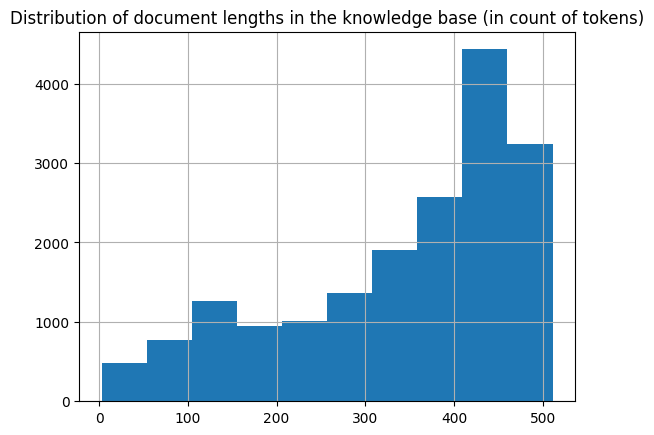

In [6]:
from sentence_transformers import SentenceTransformer

# To get the value of the max sequence_length, we will query the underlying `SentenceTransformer` object used in the RecursiveCharacterTextSplitter.
print(f"Model's maximum sequence length: {SentenceTransformer('thenlper/gte-small').max_seq_length}")

tokenizer = AutoTokenizer.from_pretrained(EMBEDDING_MODEL_NAME)
lengths = [len(tokenizer.encode(doc.page_content)) for doc in docs_processed]

# Plot the distrubution of document lengths, counted as the number of tokens
fig = pd.Series(lengths).hist()
plt.title("Distribution of document lengths in the knowledge base (in count of tokens)")
plt.show()

Analysis of the documents in the vector store and how they relate to the query. Can be used to refine vector store

In [7]:
import pacmap
import numpy as np
import plotly.express as px

# embed a user query in the same space
query_vector = embedding_model.embed_query(QUESTION)

embedding_projector = pacmap.PaCMAP(n_components=2, n_neighbors=None, MN_ratio=0.5, FP_ratio=2.0, random_state=1)
embeddings_2d = [
    list(KNOWLEDGE_VECTOR_DATABASE.index.reconstruct_n(idx, 1)[0]) for idx in range(len(docs_processed))
] + [query_vector]

# fit the data (The index of transformed data corresponds to the index of the original data)
documents_projected = embedding_projector.fit_transform(np.array(embeddings_2d), init="pca")

df = pd.DataFrame.from_dict(
    [
        {
            "x": documents_projected[i, 0],
            "y": documents_projected[i, 1],
            "source": docs_processed[i].metadata["source"].split("/")[1],
            "extract": docs_processed[i].page_content[:100] + "...",
            "symbol": "circle",
            "size_col": 4,
        }
        for i in range(len(docs_processed))
    ]
    + [
        {
            "x": documents_projected[-1, 0],
            "y": documents_projected[-1, 1],
            "source": "User query",
            "extract": QUESTION,
            "size_col": 100,
            "symbol": "star",
        }
    ]
)

# visualize the embedding
fig = px.scatter(
    df,
    x="x",
    y="y",
    color="source",
    hover_data="extract",
    size="size_col",
    symbol="symbol",
    color_discrete_map={"User query": "black"},
    width=1000,
    height=700,
)
fig.update_traces(
    marker=dict(opacity=1, line=dict(width=0, color="DarkSlateGrey")),
    selector=dict(mode="markers"),
)
fig.update_layout(
    legend_title_text="<b>Chunk source</b>",
    title="<b>2D Projection of Chunk Embeddings via PaCMAP</b>",
)
fig.show()

/mnt/e/LLM/rag-analysis/.venv/lib/python3.10/site-packages/pacmap/pacmap.py:828: UserWarning: Warning: random state is set to 1
  warnings.warn(f'Warning: random state is set to {_RANDOM_STATE}')


Defining the pipeline for reading the prompt, "relevant documents", and generating the response

In [8]:
bnb_config = BitsAndBytesConfig(
    load_in_4bit=True,
    bnb_4bit_use_double_quant=True,
    bnb_4bit_quant_type="nf4",
    bnb_4bit_compute_dtype=torch.bfloat16,
)
model = AutoModelForCausalLM.from_pretrained(READER_MODEL_NAME, quantization_config=bnb_config)
tokenizer = AutoTokenizer.from_pretrained(READER_MODEL_NAME)

READER_LLM = pipeline(
    model=model,
    tokenizer=tokenizer,
    task="text-generation",
    do_sample=True,
    temperature=0.2,
    repetition_penalty=1.1,
    return_full_text=False,
    max_new_tokens=500,
)

`low_cpu_mem_usage` was None, now set to True since model is quantized.
Loading checkpoint shards: 100%|██████████| 8/8 [00:20<00:00,  2.59s/it]


Defining the prompts that will be used, allowing for relevant documents to be used in the response. The `context` is used to insert relevant documents into the query to the LLM to keep the result on topic based on the provided documents

In [9]:
rag_prompt_in_chat_format = [
    {
        "role": "system",
        "content": """Using the information contained in the context,
give a comprehensive answer to the question.
Respond only to the question asked, response should be concise and relevant to the question.
Provide the number of the source document when relevant.
If the answer cannot be deduced from the context, do not give an answer.""",
    },
    {
        "role": "user",
        "content": """Context:
{context}
---
Now here is the question you need to answer.

Question: {question}""",
    },
]
RAG_PROMPT_TEMPLATE = tokenizer.apply_chat_template(
    rag_prompt_in_chat_format, tokenize=False, add_generation_prompt=True
)

llm_prompt_in_chat_format = [
    {
        "role": "system",
        "content": """Give a comprehensive answer to the question.
Respond only to the question asked, response should be concise and relevant to the question.
Provide the number of the source document when relevant.
If the answer cannot be deduced from the context, do not give an answer.""",
    },
    {
        "role": "user",
        "content": """
Here is the question you need to answer.

Question: {question}""",
    },
]
LLM_PROMPT_TEMPLATE = tokenizer.apply_chat_template(
    llm_prompt_in_chat_format, tokenize=False, add_generation_prompt=True
)

Define the reranker for resorting the relevant documents. This model digs a little deeper into the content of the document to attempt to better align the documents with the 

In [10]:
RERANKER = RAGPretrainedModel.from_pretrained(RERANKER_MODEL)

In [33]:
def answer_with_rag(
    question: str,
    llm: Pipeline,
    knowledge_index: FAISS,
    reranker: Optional[RAGPretrainedModel] = None,
    num_retrieved_docs: int = 30,
    num_docs_final: int = 5,
) -> Tuple[str, List[LangchainDocument]]:
    """
    Generate an answer to the prompt using the RAG pattern using the provided vector store with optional reranking.
    If no reranking model is provided then no reranking is done.
    Returns an answer to the prompt and the sources used to generate the response
    """
    # Gather documents with retriever
    print("=> Retrieving documents...")
    relevant_docs = knowledge_index.similarity_search(query=question, k=num_retrieved_docs)
    doc_sources = [doc.metadata for doc in relevant_docs]
    relevant_docs_content = [doc.page_content for doc in relevant_docs]  # keep only the text

    # Optionally rerank results
    if reranker:
        print("=> Reranking documents...")
        print(relevant_docs[0])
        ranked_docs = reranker.rerank(question, relevant_docs_content, k=num_docs_final)
        # doc_sources = [doc.metadata for doc in relevant_docs]
        ranked_sources = []
        for doc in ranked_docs:
            index = relevant_docs_content.index(doc["content"])
            ranked_sources.append(doc_sources[index])
        doc_sources = ranked_sources
        relevant_docs_content = [doc["content"] for doc in ranked_docs]


    relevant_docs_content = relevant_docs_content[:num_docs_final]

    # Build the final prompt
    context = "\nExtracted documents:\n"
    context += "".join([f"Document {str(i)}:::\n" + doc for i, doc in enumerate(relevant_docs_content)])

    final_prompt = RAG_PROMPT_TEMPLATE.format(question=question, context=context)

    # Redact an answer
    print("=> Generating answer...")
    answer = llm(final_prompt)[0]["generated_text"]

    return answer, doc_sources[:num_docs_final]

def answer_with_no_rag(
    question: str,
    llm: Pipeline,
) -> str:
    """
    Generate an answer to the prompt using just the provided pipeline model
    Returns an answer to the prompt
    """
    prompt = LLM_PROMPT_TEMPLATE.format(question=question)

    # Redact an answer
    print("=> Generating answer...")
    answer = llm(prompt)[0]["generated_text"]

    return answer

In [34]:
answer, relevant_docs = answer_with_rag(QUESTION, READER_LLM, KNOWLEDGE_VECTOR_DATABASE, reranker=RERANKER)
print(answer)
# print(relevant_docs)

=> Retrieving documents...
=> Reranking documents...
page_content='```\n\nOn the other hand, by using our Japanese tokenizer, the prompt is split into interpretable tokens and the number of tokens is reduced. For example, "サラリーマン 油絵" can be tokenized as `[\'▁\', \'サラリーマン\', \'▁\', \'油\', \'絵\']`, which is correctly tokenized in Japanese.\n```python\nfrom transformers import T5Tokenizer\ntokenizer = T5Tokenizer.from_pretrained("rinna/japanese-stable-diffusion", subfolder="tokenizer", use_auth_token=True)\ntokenizer.do_lower_case = True\ntokens = tokenizer(text, add_special_tokens=False)[\'input_ids\']\nprint("tokens:", tokenizer.convert_ids_to_tokens(tokens))\n# tokens: [\'▁\', \'サラリーマン\', \'▁\', \'油\', \'絵\']\nprint("decoded text:", tokenizer.decode(tokens))\n# decoded text: サラリーマン 油絵' metadata={'source': 'huggingface/blog/blob/main/japanese-stable-diffusion.md', 'start_index': 7273}


100%|██████████| 1/1 [00:00<00:00,  3.76it/s]


=> Generating answer...
To tokenize a prompt using the Transformers library in Python, you can follow these steps:

1. Import the necessary modules:

```python
from transformers import AutoTokenizer
```

2. Instantiate the tokenizer object and load the pretrained model:

```python
tokenizer = AutoTokenizer.from_pretrained('your_model_name')
```

Replace `your_model_name` with the name of the pretrained model you want to use for tokenization.

3. Tokenize the prompt:

```python
tokens = tokenizer(prompt, return_tensors='pt')
```

This will return a dictionary containing the input IDs and attention masks required for feeding the model during training or prediction.

4. Optionally, you can convert the input IDs to their corresponding tokens:

```python
print(tokenizer.convert_ids_to_tokens(tokens['input_ids']))
```

This will print a list of tokens that correspond to the input IDs returned by the `tokenizer()` function.

In your specific case, you can replace `prompt` with the string "eld

In [35]:
for doc in relevant_docs:
    print(doc['source'])

huggingface/blog/blob/main/mixtral.md
huggingface/diffusers/blob/main/docs/source/en/using-diffusers/write_own_pipeline.md
huggingface/blog/blob/main/japanese-stable-diffusion.md
huggingface/transformers/blob/main/docs/source/en/chat_templating.md
huggingface/diffusers/blob/main/docs/source/en/using-diffusers/img2img.md


In [38]:
answer, doc_sources = answer_with_rag(QUESTION, READER_LLM, KNOWLEDGE_VECTOR_DATABASE)
print(answer)
print(relevant_docs)

=> Retrieving documents...
=> Generating answer...
To tokenize a prompt using the provided context, follow these steps:

1. Import the necessary modules from Hugging Face Transformers library:

   ```python
   from transformers import T5Tokenizer
   ```

2. Load the pre-trained tokenizer for Japanese stable diffusion model:

   ```python
   tokenizer = T5Tokenizer.from_pretrained("rinna/japanese-stable-diffusion", subfolder="tokenizer", use_auth_token=True)
   ```

3. Set the `do_lower_case` parameter to true to convert all characters to lower case:

   ```python
   tokenizer.do_lower_case = True
   ```

4. Tokenize the prompt using the loaded tokenizer:

   ```python
   tokens = tokenizer(prompt, add_special_tokens=False)['input_ids']
   ```

5. Convert the token IDs to human-readable tokens:

   ```python
   print("tokens:", tokenizer.convert_ids_to_tokens(tokens))
   ```

6. Decode the tokenized text back to the original string:

   ```python
   print("decoded text:", tokenizer.deco

In [40]:
for doc in doc_sources:
    print(doc['source'])

huggingface/blog/blob/main/japanese-stable-diffusion.md
huggingface/transformers/blob/main/docs/source/en/tasks/token_classification.md
huggingface/diffusers/blob/main/docs/source/en/using-diffusers/write_own_pipeline.md
huggingface/tokenizers/blob/main/docs/source-doc-builder/pipeline.mdx
huggingface/blog/blob/main/mixtral.md


In [ ]:
answer = answer_with_no_rag(QUESTION, READER_LLM)
print(answer)